# ECCO Analysis

In [2]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import scipy.stats
import sys
sys.path.append('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/code/GitHub/ECCOv4-py')
import ecco_v4_py as ecco
import datetime
import geopandas
from cartopy.mpl.geoaxes import GeoAxes
import cartopy
from sklearn.metrics import mean_squared_error

## Load data

In [3]:
## Load grid
ecco_grid = xr.open_dataset('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/ECCO/ECCO_L4_GEOMETRY_LLC0090GRID_V4R4/GRID_GEOMETRY_ECCO_V4r4_native_llc0090.nc')
ecco_grid = ecco_grid.isel(tile=[10,11])

fnames = glob.glob('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/ECCO/Evaluated_Budgets/eccov4r4_budg_heat_salt_2005_2017/*.nc')
ds = xr.open_mfdataset(fnames, parallel=True, data_vars='minimal', coords='minimal', compat='override')
ds

OSError: no files to open

## Interpolate onto a 1 deg by 1 deg grid
This takes ~an hour and 45 minutes

In [204]:
new_grid_delta_lat = 1
new_grid_delta_lon = 1

new_grid_min_lat = -10
new_grid_max_lat = 35

new_grid_min_lon = -100
new_grid_max_lon = -37


lon_shape = len(np.arange(new_grid_min_lon,new_grid_max_lon,new_grid_delta_lon))
lat_shape = len(np.arange(new_grid_min_lat,new_grid_max_lat,new_grid_delta_lat))

depth_len = 29 # index for 1000 m

G_total_TH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
G_total_TH_interp[:] = np.nan
adv_hConvHx_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
adv_hConvHx_interp[:] = np.nan
adv_hConvHy_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
adv_hConvHy_interp[:] = np.nan
adv_vConvH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
adv_vConvH_interp[:] = np.nan
dif_hConvHx_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
dif_hConvHx_interp[:] = np.nan
dif_hConvHy_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
dif_hConvHy_interp[:] = np.nan
dif_vConvH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
dif_vConvH_interp[:] = np.nan
G_forcing_TH_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
G_forcing_TH_interp[:] = np.nan
G_total_Slt_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
G_total_Slt_interp[:] = np.nan
adv_hConvSx_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
adv_hConvSx_interp[:] = np.nan
adv_hConvSy_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
adv_hConvSy_interp[:] = np.nan
adv_vConvS_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
adv_vConvS_interp[:] = np.nan
dif_hConvSx_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
dif_hConvSx_interp[:] = np.nan
dif_hConvSy_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
dif_hConvSy_interp[:] = np.nan
dif_vConvS_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
dif_vConvS_interp[:] = np.nan
G_forcing_Slt_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
G_forcing_Slt_interp[:] = np.nan
salt_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
salt_interp[:] = np.nan
temp_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
temp_interp[:] = np.nan
Qnet_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
Qnet_interp[:] = np.nan
SWpen_interp = np.empty([lat_shape,lon_shape,depth_len,len(ds.time_snp)])
SWpen_interp[:] = np.nan


for k in np.arange(0,depth_len):
    for t in np.arange(0,len(ds.time_snp)):
        new_grid_lon, new_grid_lat, _, _, G_total_TH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_total_TH.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, G_forcing_TH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_forcing_TH.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, G_total_Slt_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_total_Slt.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, G_forcing_Slt_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.G_forcing_Slt.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, salt_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.salt.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, temp_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.temp.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, Qnet_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.Qnet.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, SWpen_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.SWpen.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        
        _, _, _, _, adv_hConvHx_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_hConvHx.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, adv_hConvHy_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_hConvHy.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, adv_vConvH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_vConvH.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)        

        _, _, _, _, dif_hConvHx_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_hConvHx.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, dif_hConvHy_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_hConvHy.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, dif_vConvH_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_vConvH.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, adv_hConvSx_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_hConvSx.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, adv_hConvSy_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_hConvSy.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)        
        
        _, _, _, _, adv_vConvS_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.adv_vConvS.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, dif_hConvSx_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_hConvSx.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        
        _, _, _, _, dif_hConvSy_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_hConvSy.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)

        _, _, _, _, dif_vConvS_interp[:,:,k,t] = ecco.resample_to_latlon(ecco_grid.XC.values,
                                     ecco_grid.YC.values,
                                     ds.dif_vConvS.isel(time_snp=t,k=k).values,
                                     new_grid_min_lat, new_grid_max_lat, new_grid_delta_lat,
                                     new_grid_min_lon, new_grid_max_lon, new_grid_delta_lon,
                                     fill_value = np.NaN,
                                     mapping_method = 'nearest_neighbor',
                                     radius_of_influence = 120000)
        


    print('k',k)
    print(datetime.datetime.now())


## Created xarray dataset and save

In [205]:
interp_ds = xr.Dataset(
    data_vars=dict(
        temp_tendency=(["lat", "lon", "depth", "time"], G_total_TH_interp),
        temp_advection_x=(["lat", "lon", "depth", "time"], adv_hConvHx_interp),
        temp_advection_y=(["lat", "lon", "depth", "time"], adv_hConvHy_interp),
        temp_advection_v=(["lat", "lon", "depth", "time"], adv_vConvH_interp),
        temp_diffusion_x=(["lat", "lon", "depth", "time"], dif_hConvHx_interp),
        temp_diffusion_y=(["lat", "lon", "depth", "time"], dif_hConvHy_interp),
        temp_diffusion_v=(["lat", "lon", "depth", "time"], dif_vConvH_interp),
        temp_forcing=(["lat", "lon", "depth", "time"], G_forcing_TH_interp),
        temp=(["lat", "lon", "depth", "time"], temp_interp),
        salt_tendency=(["lat", "lon", "depth", "time"], G_total_Slt_interp),
        salt_advection_x=(["lat", "lon", "depth", "time"], adv_hConvSx_interp),
        salt_advection_y=(["lat", "lon", "depth", "time"], adv_hConvSy_interp),
        salt_advection_v=(["lat", "lon", "depth", "time"], adv_vConvS_interp),
        salt_diffusion_x=(["lat", "lon", "depth", "time"], dif_hConvSx_interp),
        salt_diffusion_y=(["lat", "lon", "depth", "time"], dif_hConvSy_interp),
        salt_diffusion_v=(["lat", "lon", "depth", "time"], dif_vConvS_interp),
        salt_forcing=(["lat", "lon", "depth", "time"], G_forcing_Slt_interp),
        salt=(["lat", "lon", "depth", "time"], salt_interp),
        SWpen=(["lat", "lon", "depth", "time"], SWpen_interp),
        Qnet=(["lat", "lon", "depth", "time"], Qnet_interp),
    ),
    coords=dict(
        lon=new_grid_lon[0,:],
        lat=new_grid_lat[:,0],
        time=ds.time_snp.values,
        depth=ecco_grid.Z[0:29].values
    ),
)

interp_ds




In [206]:
del G_total_TH_interp, adv_hConvHx_interp, adv_hConvHy_interp, adv_vConvH_interp,dif_hConvHx_interp,dif_hConvHy_interp,dif_vConvH_interp
del G_forcing_TH_interp, G_total_Slt_interp,adv_hConvSx_interp,adv_hConvSy_interp,adv_vConvS_interp,dif_hConvSx_interp,dif_hConvSy_interp,dif_vConvS_interp
del G_forcing_Slt_interp,salt_interp,temp_interp,Qnet_interp,SWpen_interp
del ds, ecco_grid

## Save

In [7]:
interp_ds.to_netcdf('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/ECCO/Evaluated_Budgets/ECCO_2005_2017_Interpolated_Fields.nc')

## Load

In [8]:
ds = xr.open_dataset('/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/ECCO/Evaluated_Budgets/ECCO_2005_2017_Interpolated_Fields.nc')
ds

<xarray.Dataset>
Dimensions:           (lat: 45, lon: 63, depth: 29, time: 4744)
Coordinates:
  * lon               (lon) float64 -99.5 -98.5 -97.5 ... -39.5 -38.5 -37.5
  * lat               (lat) float64 -9.5 -8.5 -7.5 -6.5 ... 31.5 32.5 33.5 34.5
  * time              (time) datetime64[ns] 2005-01-01T12:00:00 ... 2017-12-3...
  * depth             (depth) float32 -5.0 -15.0 -25.0 ... -909.7 -1.007e+03
Data variables: (12/20)
    temp_tendency     (lat, lon, depth, time) float64 ...
    temp_advection_x  (lat, lon, depth, time) float64 ...
    temp_advection_y  (lat, lon, depth, time) float64 ...
    temp_advection_v  (lat, lon, depth, time) float64 ...
    temp_diffusion_x  (lat, lon, depth, time) float64 ...
    temp_diffusion_y  (lat, lon, depth, time) float64 ...
    ...                ...
    salt_diffusion_y  (lat, lon, depth, time) float64 ...
    salt_diffusion_v  (lat, lon, depth, time) float64 ...
    salt_forcing      (lat, lon, depth, time) float64 ...
    salt              (lat, lon, depth, time) float64 ...
    SWpen             (lat, lon, depth, time) float64 ...
    Qnet              (lat, lon, depth, time) float64 ...

In [12]:
## Load Atlantic shapefile for more precise clipping
fname ='/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/data/atl/iho.shp'
atl = geopandas.read_file(fname)

## Need to do this to play nice with geopandas/rio
ds = ds.rename({'lon': 'x','lat': 'y'})
## Clip to Atlantic shapefile
ds = ds.rio.write_crs('WGS84', inplace=True)
ds = ds.rio.clip(atl.geometry.values, atl.crs)

## Do this for plotting significant points
lonmesh, latmesh = np.meshgrid(ds.x,ds.y)

In [13]:
ds

<xarray.Dataset>
Dimensions:           (x: 61, y: 40, time: 4744, depth: 29)
Coordinates:
  * x                 (x) float64 -97.5 -96.5 -95.5 -94.5 ... -39.5 -38.5 -37.5
  * y                 (y) float64 -4.5 -3.5 -2.5 -1.5 ... 31.5 32.5 33.5 34.5
  * time              (time) datetime64[ns] 2005-01-01T12:00:00 ... 2017-12-3...
  * depth             (depth) float32 -5.0 -15.0 -25.0 ... -909.7 -1.007e+03
    spatial_ref       int64 0
Data variables: (12/20)
    temp_tendency     (y, x, depth, time) float64 nan nan ... -402.4 -4.533e+03
    temp_advection_x  (y, x, depth, time) float64 nan nan ... 2.736e-08
    temp_advection_y  (y, x, depth, time) float64 nan nan ... -9.519e-07
    temp_advection_v  (y, x, depth, time) float64 nan nan ... -5.763e-08
    temp_diffusion_x  (y, x, depth, time) float64 nan nan ... -1.269e-09
    temp_diffusion_y  (y, x, depth, time) float64 nan nan ... 8.34e-10
    ...                ...
    salt_diffusion_y  (y, x, depth, time) float64 nan nan ... 1.417e-10
    salt_diffusion_v  (y, x, depth, time) float64 nan nan ... -8.618e-11
    salt_forcing      (y, x, depth, time) float64 nan nan nan ... 0.0 0.0 0.0
    salt              (y, x, depth, time) float64 nan nan ... 0.03015 0.02538
    SWpen             (y, x, depth, time) float64 nan nan nan ... 0.0 0.0 -0.0
    Qnet              (y, x, depth, time) float64 nan nan nan ... 0.0 0.0 -0.0

## Correlations

In [14]:
temp_tendency_hadvectionx_corr = np.empty(ds.temp.shape[0:3])
temp_tendency_hadvectionx_corr[:] = np.nan
temp_tendency_hadvectiony_corr = np.empty(ds.temp.shape[0:3])
temp_tendency_hadvectiony_corr[:] = np.nan
temp_tendency_vadvection_corr = np.empty(ds.temp.shape[0:3])
temp_tendency_vadvection_corr[:] = np.nan
temp_tendency_hdiffusionx_corr = np.empty(ds.temp.shape[0:3])
temp_tendency_hdiffusionx_corr[:] = np.nan
temp_tendency_hdiffusiony_corr = np.empty(ds.temp.shape[0:3])
temp_tendency_hdiffusiony_corr[:] = np.nan
temp_tendency_vdiffusion_corr = np.empty(ds.temp.shape[0:3])
temp_tendency_vdiffusion_corr[:] = np.nan
temp_tendency_SWpen_corr = np.empty(ds.temp.shape[0:3])
temp_tendency_SWpen_corr[:] = np.nan
temp_tendency_Qnet_corr = np.empty(ds.temp.shape[0:3])
temp_tendency_Qnet_corr[:] = np.nan


temp_tendency_hadvectionx_pval = np.empty(ds.temp.shape[0:3])
temp_tendency_hadvectionx_pval[:] = np.nan
temp_tendency_hadvectiony_pval = np.empty(ds.temp.shape[0:3])
temp_tendency_hadvectiony_pval[:] = np.nan
temp_tendency_vadvection_pval = np.empty(ds.temp.shape[0:3])
temp_tendency_vadvection_pval[:] = np.nan
temp_tendency_hdiffusionx_pval = np.empty(ds.temp.shape[0:3])
temp_tendency_hdiffusionx_pval[:] = np.nan
temp_tendency_hdiffusiony_pval = np.empty(ds.temp.shape[0:3])
temp_tendency_hdiffusiony_pval[:] = np.nan
temp_tendency_vdiffusion_pval = np.empty(ds.temp.shape[0:3])
temp_tendency_vdiffusion_pval[:] = np.nan
temp_tendency_SWpen_pval = np.empty(ds.temp.shape[0:3])
temp_tendency_SWpen_pval[:] = np.nan
temp_tendency_Qnet_pval = np.empty(ds.temp.shape[0:3])
temp_tendency_Qnet_pval[:] = np.nan


for x in range(0,len(ds.x)):
    for y in range(0,len(ds.y)):
        for depth in range(0,len(ds.depth)):
            ## Pull out tendency values at specific point
            checknan = ds.temp_tendency.isel(x=x,y=y,depth=depth)

            ## Check if values for all times are nan, if not do the correlation
            if np.sum(np.isnan(checknan.values))!=len(ds.time):
                temp_tendency_hadvectionx_corr[y,x,depth], temp_tendency_hadvectionx_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_x.isel(x=x,y=y,depth=depth))
                temp_tendency_hadvectiony_corr[y,x,depth], temp_tendency_hadvectiony_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_y.isel(x=x,y=y,depth=depth))
                temp_tendency_vadvection_corr[y,x,depth], temp_tendency_vadvection_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_v.isel(x=x,y=y,depth=depth))
                
                temp_tendency_hdiffusionx_corr[y,x,depth], temp_tendency_hdiffusionx_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_x.isel(x=x,y=y,depth=depth))
                temp_tendency_hdiffusiony_corr[y,x,depth], temp_tendency_hdiffusiony_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_y.isel(x=x,y=y,depth=depth))
                temp_tendency_vdiffusion_corr[y,x,depth], temp_tendency_vdiffusion_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_v.isel(x=x,y=y,depth=depth))
                
                temp_tendency_SWpen_corr[y,x,depth], temp_tendency_SWpen_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.SWpen.isel(x=x,y=y,depth=depth))
                temp_tendency_Qnet_corr[y,x,depth], temp_tendency_Qnet_pval[y,x,depth] = scipy.stats.pearsonr(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.Qnet.isel(x=x,y=y,depth=depth))


/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


In [26]:
salt_tendency_hadvectionx_corr = np.empty(ds.temp.shape[0:3])
salt_tendency_hadvectionx_corr[:] = np.nan
salt_tendency_hadvectiony_corr = np.empty(ds.temp.shape[0:3])
salt_tendency_hadvectiony_corr[:] = np.nan
salt_tendency_vadvection_corr = np.empty(ds.temp.shape[0:3])
salt_tendency_vadvection_corr[:] = np.nan
salt_tendency_hdiffusionx_corr = np.empty(ds.temp.shape[0:3])
salt_tendency_hdiffusionx_corr[:] = np.nan
salt_tendency_hdiffusiony_corr = np.empty(ds.temp.shape[0:3])
salt_tendency_hdiffusiony_corr[:] = np.nan
salt_tendency_vdiffusion_corr = np.empty(ds.temp.shape[0:3])
salt_tendency_vdiffusion_corr[:] = np.nan
salt_tendency_forcing_corr = np.empty(ds.temp.shape[0:3])
salt_tendency_forcing_corr[:] = np.nan

salt_tendency_hadvectionx_pval = np.empty(ds.temp.shape[0:3])
salt_tendency_hadvectionx_pval[:] = np.nan
salt_tendency_hadvectiony_pval = np.empty(ds.temp.shape[0:3])
salt_tendency_hadvectiony_pval[:] = np.nan
salt_tendency_vadvection_pval = np.empty(ds.temp.shape[0:3])
salt_tendency_vadvection_pval[:] = np.nan
salt_tendency_hdiffusionx_pval = np.empty(ds.temp.shape[0:3])
salt_tendency_hdiffusionx_pval[:] = np.nan
salt_tendency_hdiffusiony_pval = np.empty(ds.temp.shape[0:3])
salt_tendency_hdiffusiony_pval[:] = np.nan
salt_tendency_vdiffusion_pval = np.empty(ds.temp.shape[0:3])
salt_tendency_vdiffusion_pval[:] = np.nan
salt_tendency_forcing_pval = np.empty(ds.temp.shape[0:3])
salt_tendency_forcing_pval[:] = np.nan


for x in range(0,len(ds.x)):
    for y in range(0,len(ds.y)):
        for depth in range(0,len(ds.depth)):
            ## Pull out tendency values at specific point
            checknan = ds.salt_tendency.isel(x=x,y=y,depth=depth)

            ## Check if values for all times are nan, if not do the correlation
            if np.sum(np.isnan(checknan.values))==0:
                salt_tendency_hadvectionx_corr[y,x,depth], salt_tendency_hadvectionx_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_x.isel(x=x,y=y,depth=depth))
                salt_tendency_hadvectiony_corr[y,x,depth], salt_tendency_hadvectiony_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_y.isel(x=x,y=y,depth=depth))
                salt_tendency_vadvection_corr[y,x,depth], salt_tendency_vadvection_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_v.isel(x=x,y=y,depth=depth))
                
                salt_tendency_hdiffusionx_corr[y,x,depth], salt_tendency_hdiffusionx_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_x.isel(x=x,y=y,depth=depth))
                salt_tendency_hdiffusiony_corr[y,x,depth], salt_tendency_hdiffusiony_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_y.isel(x=x,y=y,depth=depth))
                salt_tendency_vdiffusion_corr[y,x,depth], salt_tendency_vdiffusion_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_v.isel(x=x,y=y,depth=depth))

                ## For some reason salt forcing has some nans when tendency doesn't so need to do a specific check for this one to run the correlation
                checknan = ds.salt_forcing.isel(x=x,y=y,depth=depth)
                if np.sum(np.isnan(checknan.values))==0:
                    salt_tendency_forcing_corr[y,x,depth], salt_tendency_forcing_pval[y,x,depth] = scipy.stats.pearsonr(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_forcing.isel(x=x,y=y,depth=depth))


/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


In [199]:
# for k in np.arange(0,len(ds.depth)):
#     fig, ax = plt.subplots(2,4, figsize=(16,7), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)
    
#     s=0.9
    
#     ####################################################################################################################################################
#     ax[0,0].contourf(ds.x,ds.y,salt_tendency_hadvectionx_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[0,0].coastlines(linewidth=1.0,zorder=10)
#     ax[0,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,0].set_title('E-W Salt Advection')
#     test = salt_tendency_hadvectionx_pval[:,:,k]<0.05
#     ax[0,0].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,1].contourf(ds.x,ds.y,salt_tendency_hadvectiony_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[0,1].coastlines(linewidth=1.0,zorder=10)
#     ax[0,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,1].set_title('N-S Salt Advection')
#     test = salt_tendency_hadvectiony_pval[:,:,k]<0.05
#     ax[0,1].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
    
#     ####################################################################################################################################################
#     ax[0,2].contourf(ds.x,ds.y,salt_tendency_vadvection_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[0,2].coastlines(linewidth=1.0,zorder=10)
#     ax[0,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,2].set_title('Vertical Salt Advection')
#     test = salt_tendency_vadvection_pval[:,:,k]<0.05
#     ax[0,2].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,3].contourf(ds.x,ds.y,salt_tendency_forcing_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[0,3].coastlines(linewidth=1.0,zorder=10)
#     ax[0,3].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,3].set_title('Salt Forcing')
#     test = salt_tendency_forcing_pval[:,:,k]<0.05
#     ax[0,3].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,0].contourf(ds.x,ds.y,salt_tendency_hdiffusionx_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[1,0].coastlines(linewidth=1.0,zorder=10)
#     ax[1,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,0].set_title('E-W Salt Diffusion')
#     test = salt_tendency_hdiffusionx_pval[:,:,k]<0.05
#     ax[1,0].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,1].contourf(ds.x,ds.y,salt_tendency_hdiffusiony_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[1,1].coastlines(linewidth=1.0,zorder=10)
#     ax[1,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,1].set_title('N-S Salt Diffusion')
#     test = salt_tendency_hdiffusiony_pval[:,:,k]<0.05
#     ax[1,1].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     im = ax[1,2].contourf(ds.x,ds.y,salt_tendency_vdiffusion_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[1,2].coastlines(linewidth=1.0,zorder=10)
#     ax[1,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,2].set_title('Vertical Salt Diffusion')
#     test = salt_tendency_vdiffusion_pval[:,:,k]<0.05
#     ax[1,2].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     plt.colorbar(im,ax=ax[1,3],label='Correlation',aspect=5,fraction=0.4)
#     glb = ax[1,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     fig.delaxes(ax[1,3])
#     plt.suptitle('2005-2017 Mean ECCO Salt Tendency at %s m Correlated with:'%(ds.depth.values[k]), fontsize=16)
    
#     plotname = f'/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Salt_Correlation/Salt_Tendency_Correlation_{-int(ds.depth.values[k])}_meters_depth.png'
#     plt.savefig(plotname, bbox_inches='tight',dpi=300,facecolor='white')


In [200]:
# for k in np.arange(0,len(ds.depth)):

#     fig, ax = plt.subplots(2,4, figsize=(16,7), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)
    
#     s=0.9
#     ####################################################################################################################################################
#     ax[0,0].contourf(ds.x,ds.y,temp_tendency_hadvectionx_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[0,0].coastlines(linewidth=1.0,zorder=10)
#     ax[0,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,0].set_title('E-W Heat Advection')
#     test = temp_tendency_hadvectionx_pval[:,:,k]<0.05
#     ax[0,0].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,1].contourf(ds.x,ds.y,temp_tendency_hadvectiony_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[0,1].coastlines(linewidth=1.0,zorder=10)
#     ax[0,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,1].set_title('N-S Heat Advection')
#     test = temp_tendency_hadvectiony_pval[:,:,k]<0.05
#     ax[0,1].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
    
#     ####################################################################################################################################################
#     ax[0,2].contourf(ds.x,ds.y,temp_tendency_vadvection_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[0,2].coastlines(linewidth=1.0,zorder=10)
#     ax[0,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,2].set_title('Vertical Heat Advection')
#     test = temp_tendency_vadvection_pval[:,:,k]<0.05
#     ax[0,2].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[0,3].contourf(ds.x,ds.y,temp_tendency_SWpen_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[0,3].coastlines(linewidth=1.0,zorder=10)
#     ax[0,3].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[0,3].set_title('Shortwave Radiation')
#     test = temp_tendency_SWpen_pval[:,:,k]<0.05
#     ax[0,3].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[0,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,0].contourf(ds.x,ds.y,temp_tendency_hdiffusionx_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[1,0].coastlines(linewidth=1.0,zorder=10)
#     ax[1,0].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,0].set_title('E-W Heat Diffusion')
#     test = temp_tendency_hdiffusionx_pval[:,:,k]<0.05
#     ax[1,0].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     ax[1,1].contourf(ds.x,ds.y,temp_tendency_hdiffusiony_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[1,1].coastlines(linewidth=1.0,zorder=10)
#     ax[1,1].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,1].set_title('N-S Heat Diffusion')
#     test = temp_tendency_hdiffusiony_pval[:,:,k]<0.05
#     ax[1,1].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     im = ax[1,2].contourf(ds.x,ds.y,temp_tendency_vdiffusion_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[1,2].coastlines(linewidth=1.0,zorder=10)
#     ax[1,2].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,2].set_title('Vertical Heat Diffusion')
#     test = temp_tendency_vdiffusion_pval[:,:,k]<0.05
#     ax[1,2].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     ####################################################################################################################################################
#     im = ax[1,3].contourf(ds.x,ds.y,temp_tendency_Qnet_corr[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=np.arange(-1,1.04,0.05))
#     ax[1,3].coastlines(linewidth=1.0,zorder=10)
#     ax[1,3].add_feature(cartopy.feature.LAND,zorder=10)
#     ax[1,3].set_title('Longwave Radiation')
#     test = temp_tendency_Qnet_pval[:,:,k]<0.05
#     ax[1,3].plot(lonmesh[test],latmesh[test],'ko',markersize=s,markeredgecolor='none')
#     glb = ax[1,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
#     glb.xlabels_top = glb.ylabels_right = False
#     ####################################################################################################################################################
    
#     plt.colorbar(im,ax=ax[:,3],label='Correlation',fraction=0.6)
    
#     plt.suptitle('2005-2017 Mean ECCO Heat Tendency at %s m Correlated with:'%(ds.depth.values[k]), fontsize=16)
    
#     plotname = f'/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Heat_Correlation/Heat_Tendency_Correlation_{-int(ds.depth.values[k])}_meters_depth.png'
#     plt.savefig(plotname, bbox_inches='tight',dpi=300,facecolor='white')


## RMSE

In [ ]:

#rms = mean_squared_error(y_actual, y_predicted, squared=False)

In [213]:
test = mean_squared_error(ds.temp_tendency.isel(y=20,x=20,depth=0),ds.temp_advection_x.isel(y=20,x=20,depth=0),squared=False)
test

6603.972167317772

In [225]:
np.nanmean(temp_tendency_hadvectionx_rmse)

5924.833081887484

In [244]:
temp_tendency_hadvectionx_rmse = np.empty(ds.temp.shape[0:3])
temp_tendency_hadvectionx_rmse[:] = np.nan
temp_tendency_hadvectiony_rmse = np.empty(ds.temp.shape[0:3])
temp_tendency_hadvectiony_rmse[:] = np.nan
temp_tendency_vadvection_rmse = np.empty(ds.temp.shape[0:3])
temp_tendency_vadvection_rmse[:] = np.nan
temp_tendency_hdiffusionx_rmse = np.empty(ds.temp.shape[0:3])
temp_tendency_hdiffusionx_rmse[:] = np.nan
temp_tendency_hdiffusiony_rmse = np.empty(ds.temp.shape[0:3])
temp_tendency_hdiffusiony_rmse[:] = np.nan
temp_tendency_vdiffusion_rmse = np.empty(ds.temp.shape[0:3])
temp_tendency_vdiffusion_rmse[:] = np.nan
temp_tendency_SWpen_rmse = np.empty(ds.temp.shape[0:3])
temp_tendency_SWpen_rmse[:] = np.nan
temp_tendency_Qnet_rmse = np.empty(ds.temp.shape[0:3])
temp_tendency_Qnet_rmse[:] = np.nan

for x in range(0,len(ds.x)):
    for y in range(0,len(ds.y)):
        for depth in range(0,len(ds.depth)):
            ## Pull out tendency values at specific point
            checknan = ds.temp_tendency.isel(x=x,y=y,depth=depth)

            ## Check if values for all times are nan, if not do the correlation
            if np.sum(np.isnan(checknan.values))!=len(ds.time):
                temp_tendency_hadvectionx_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_x.isel(x=x,y=y,depth=depth))
                temp_tendency_hadvectiony_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_y.isel(x=x,y=y,depth=depth))
                temp_tendency_vadvection_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_advection_v.isel(x=x,y=y,depth=depth))
                
                temp_tendency_hdiffusionx_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_x.isel(x=x,y=y,depth=depth))
                temp_tendency_hdiffusiony_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_y.isel(x=x,y=y,depth=depth))
                temp_tendency_vdiffusion_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.temp_diffusion_v.isel(x=x,y=y,depth=depth))
                
                temp_tendency_SWpen_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.SWpen.isel(x=x,y=y,depth=depth))
                temp_tendency_Qnet_rmse[y,x,depth] = mean_squared_error(ds.temp_tendency.isel(x=x,y=y,depth=depth),ds.Qnet.isel(x=x,y=y,depth=depth))


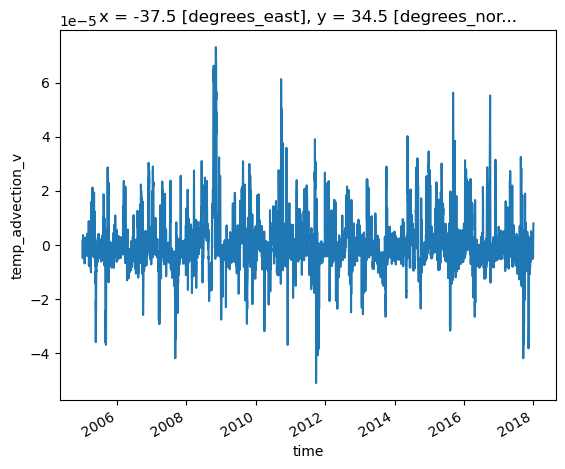

In [267]:
ds.temp_advection_v.isel(x=x,y=y,depth=0).plot()

(14245.0, 14619.0)

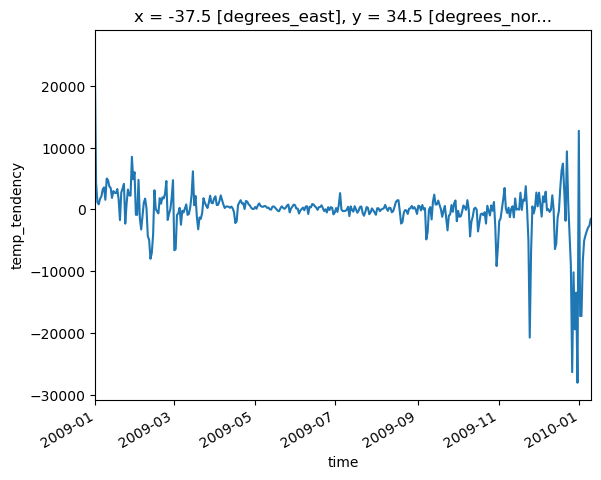

In [275]:
ds.temp_tendency.isel(x=x,y=y,depth=10).plot()
plt.xlim(pd.to_datetime('2009-01-01'),pd.to_datetime('2010-01-10'))

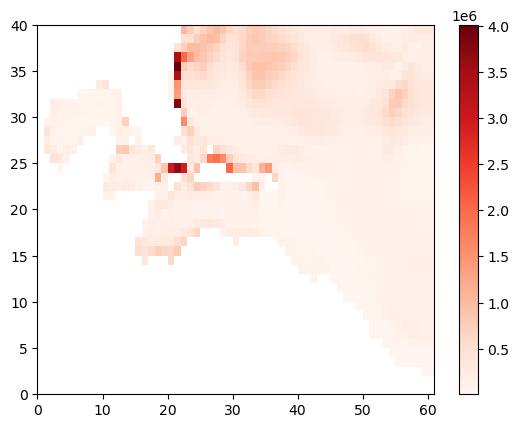

In [248]:
plt.pcolormesh(temp_tendency_vdiffusion_rmse[:,:,k],cmap='Reds')
plt.colorbar()

/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is depre

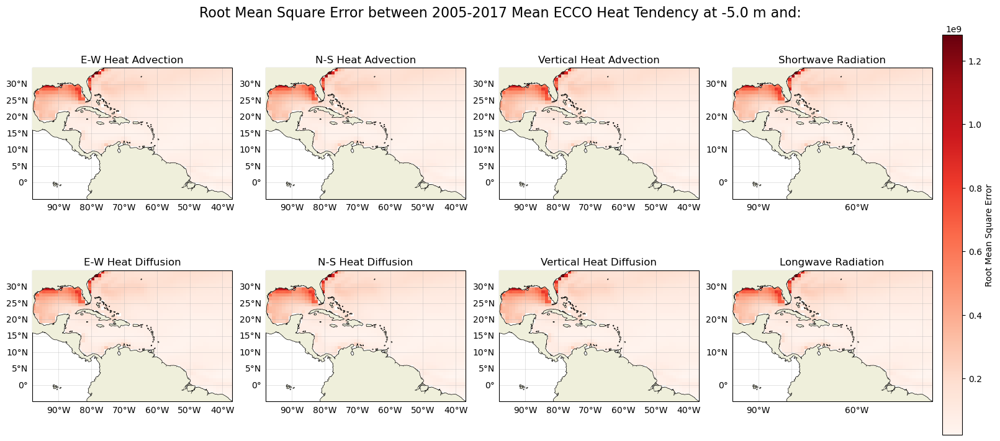

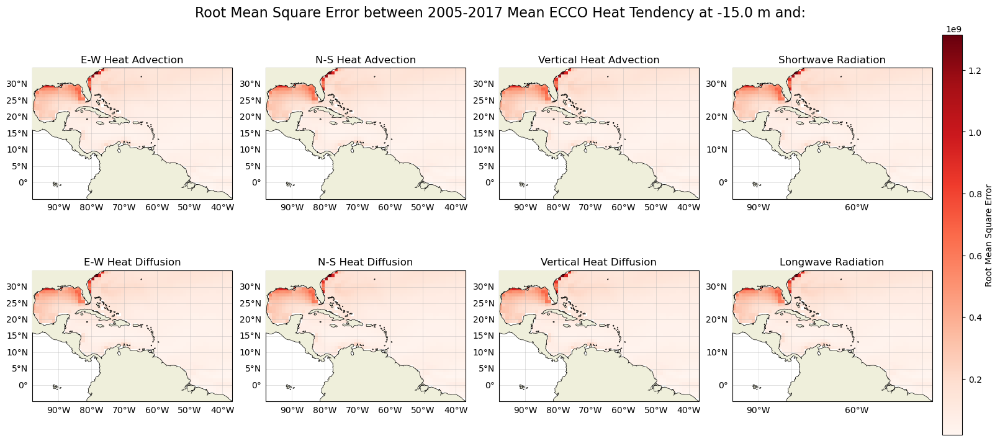

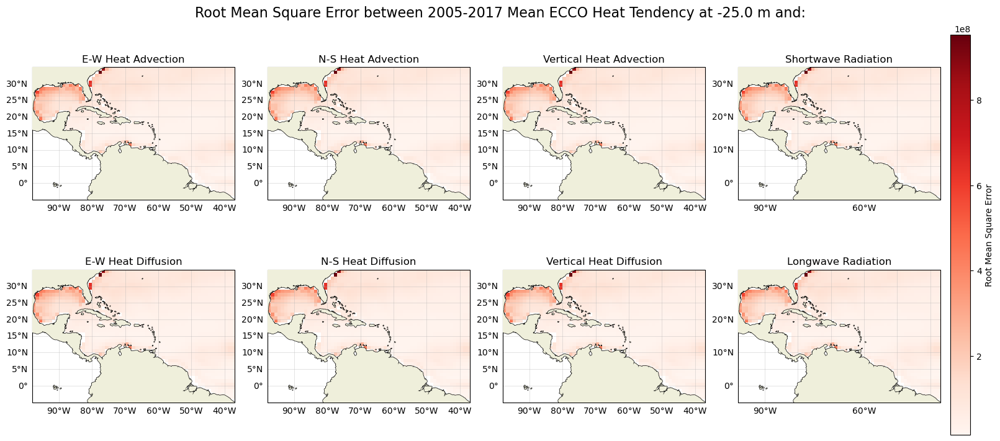

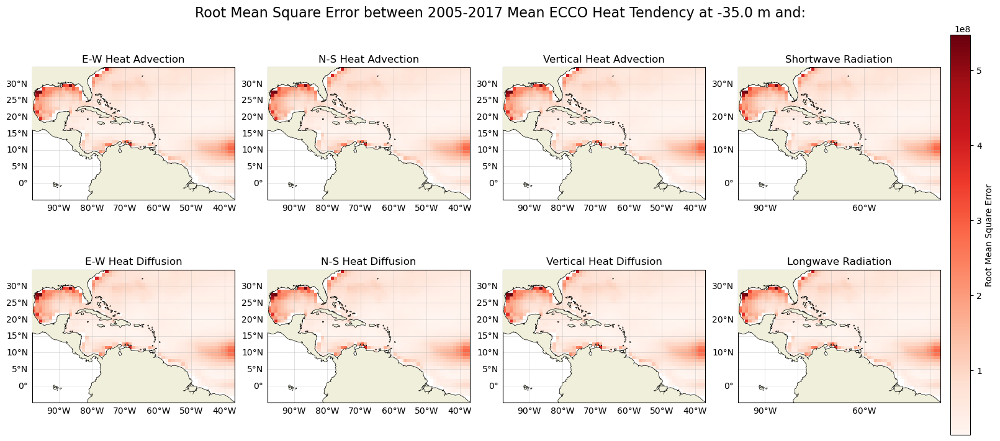

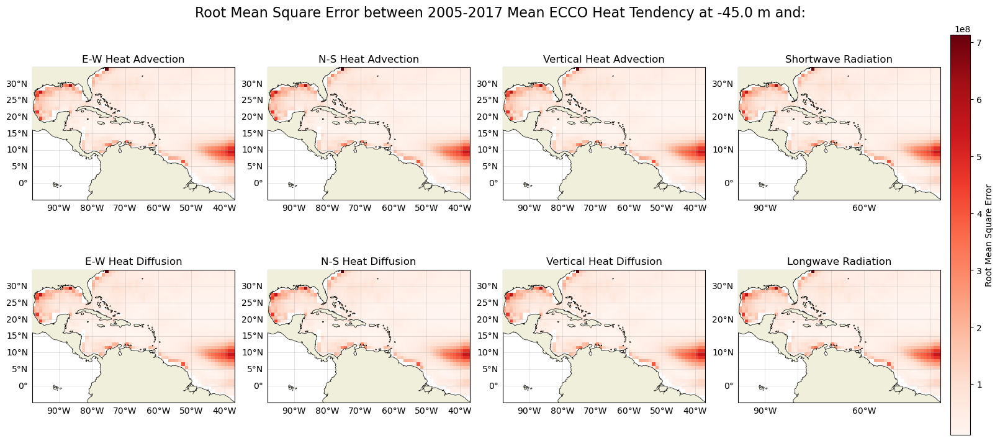

...

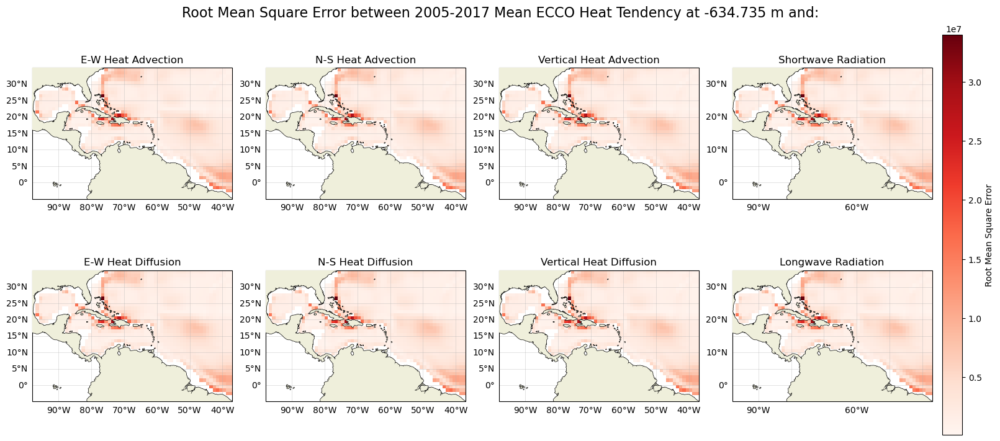

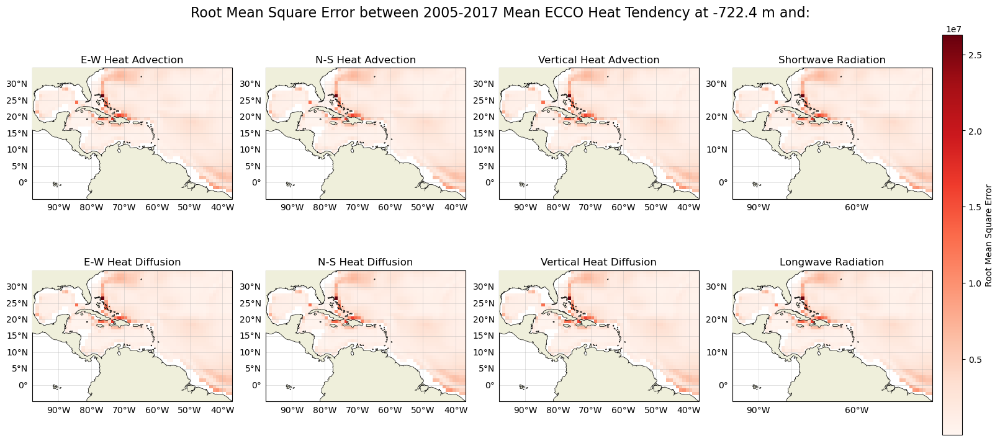

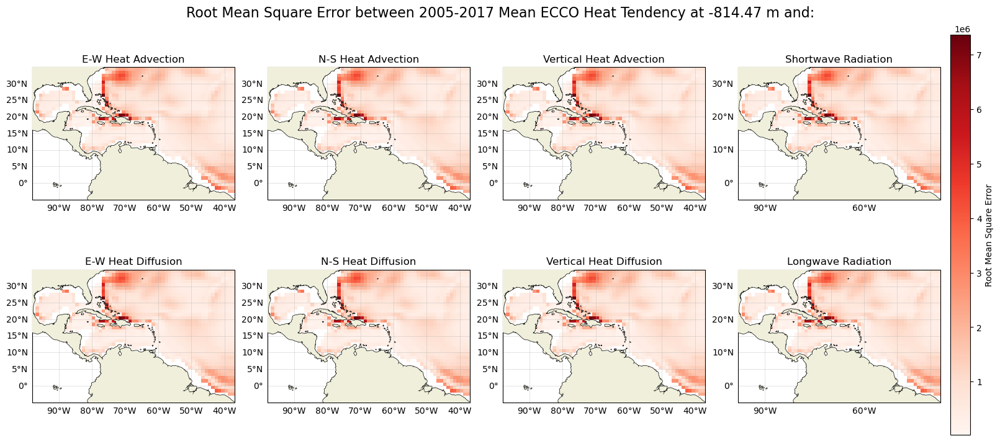

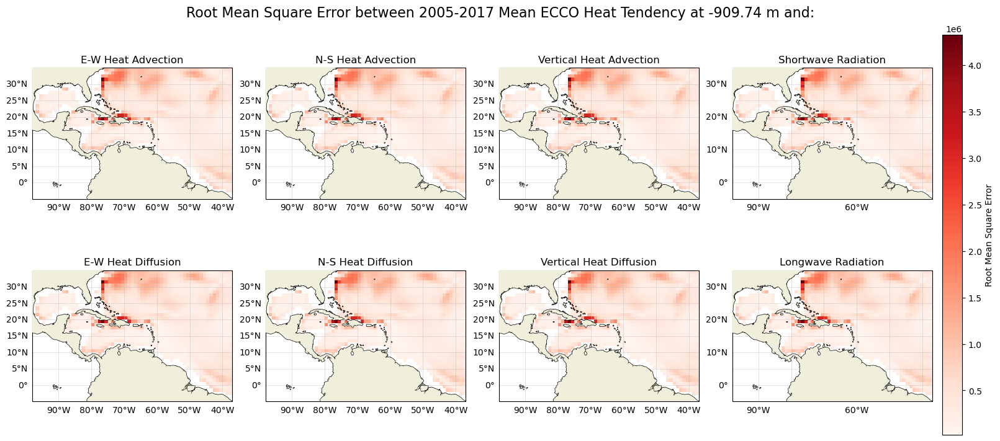

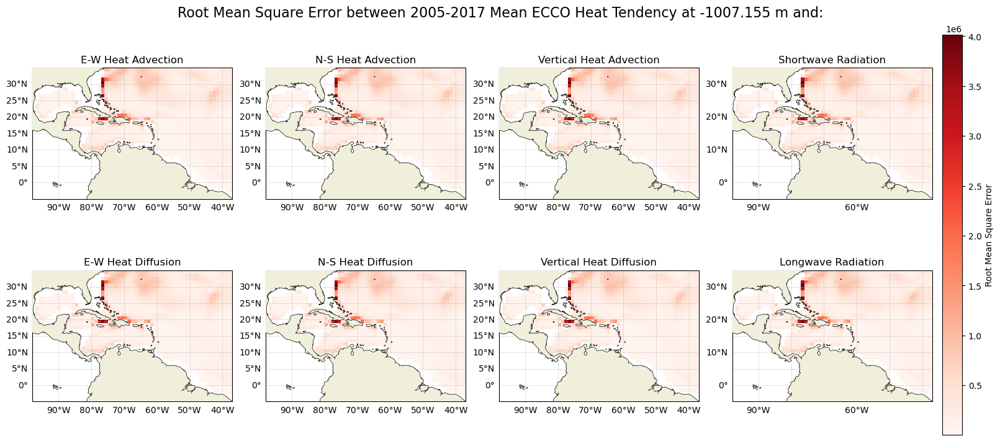

In [249]:
for k in np.arange(0,len(ds.depth)):

    fig, ax = plt.subplots(2,4, figsize=(16,7), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)
    
    s=0.9

    ####################################################################################################################################################
    ax[0,0].pcolormesh(ds.x,ds.y,temp_tendency_hadvectionx_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[0,0].coastlines(linewidth=1.0,zorder=10)
    ax[0,0].add_feature(cartopy.feature.LAND,zorder=10)
    ax[0,0].set_title('E-W Heat Advection')
    glb = ax[0,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[0,1].pcolormesh(ds.x,ds.y,temp_tendency_hadvectiony_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[0,1].coastlines(linewidth=1.0,zorder=10)
    ax[0,1].add_feature(cartopy.feature.LAND,zorder=10)
    ax[0,1].set_title('N-S Heat Advection')
    glb = ax[0,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    
    ####################################################################################################################################################
    ax[0,2].pcolormesh(ds.x,ds.y,temp_tendency_vadvection_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[0,2].coastlines(linewidth=1.0,zorder=10)
    ax[0,2].add_feature(cartopy.feature.LAND,zorder=10)
    ax[0,2].set_title('Vertical Heat Advection')
    glb = ax[0,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[0,3].pcolormesh(ds.x,ds.y,temp_tendency_SWpen_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[0,3].coastlines(linewidth=1.0,zorder=10)
    ax[0,3].add_feature(cartopy.feature.LAND,zorder=10)
    ax[0,3].set_title('Shortwave Radiation')
    glb = ax[0,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[1,0].pcolormesh(ds.x,ds.y,temp_tendency_hdiffusionx_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[1,0].coastlines(linewidth=1.0,zorder=10)
    ax[1,0].add_feature(cartopy.feature.LAND,zorder=10)
    ax[1,0].set_title('E-W Heat Diffusion')
    glb = ax[1,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[1,1].pcolormesh(ds.x,ds.y,temp_tendency_hdiffusiony_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[1,1].coastlines(linewidth=1.0,zorder=10)
    ax[1,1].add_feature(cartopy.feature.LAND,zorder=10)
    ax[1,1].set_title('N-S Heat Diffusion')
    glb = ax[1,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[1,2].pcolormesh(ds.x,ds.y,temp_tendency_vdiffusion_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[1,2].coastlines(linewidth=1.0,zorder=10)
    ax[1,2].add_feature(cartopy.feature.LAND,zorder=10)
    ax[1,2].set_title('Vertical Heat Diffusion')
    glb = ax[1,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    im = ax[1,3].pcolormesh(ds.x,ds.y,temp_tendency_Qnet_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[1,3].coastlines(linewidth=1.0,zorder=10)
    ax[1,3].add_feature(cartopy.feature.LAND,zorder=10)
    ax[1,3].set_title('Longwave Radiation')
    glb = ax[1,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    plt.colorbar(im,ax=ax[:,3],label='Root Mean Square Error',fraction=0.6)
    
    plt.suptitle('Root Mean Square Error between 2005-2017 Mean ECCO Heat Tendency at %s m and:'%(ds.depth.values[k]), fontsize=16)
    
    plotname = f'/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Heat_RMSE/Heat_RMSE_{-int(ds.depth.values[k])}_meters_depth.png'
    plt.savefig(plotname, bbox_inches='tight',dpi=300,facecolor='white')


In [250]:
salt_tendency_hadvectionx_rmse = np.empty(ds.temp.shape[0:3])
salt_tendency_hadvectionx_rmse[:] = np.nan
salt_tendency_hadvectiony_rmse = np.empty(ds.temp.shape[0:3])
salt_tendency_hadvectiony_rmse[:] = np.nan
salt_tendency_vadvection_rmse = np.empty(ds.temp.shape[0:3])
salt_tendency_vadvection_rmse[:] = np.nan
salt_tendency_hdiffusionx_rmse = np.empty(ds.temp.shape[0:3])
salt_tendency_hdiffusionx_rmse[:] = np.nan
salt_tendency_hdiffusiony_rmse = np.empty(ds.temp.shape[0:3])
salt_tendency_hdiffusiony_rmse[:] = np.nan
salt_tendency_vdiffusion_rmse = np.empty(ds.temp.shape[0:3])
salt_tendency_vdiffusion_rmse[:] = np.nan
salt_tendency_forcing_rmse = np.empty(ds.temp.shape[0:3])
salt_tendency_forcing_rmse[:] = np.nan

for x in range(0,len(ds.x)):
    for y in range(0,len(ds.y)):
        for depth in range(0,len(ds.depth)):
            ## Pull out tendency values at specific point
            checknan = ds.salt_tendency.isel(x=x,y=y,depth=depth)

            ## Check if values for all times are nan, if not do the correlation
            if np.sum(np.isnan(checknan.values))!=len(ds.time):
                salt_tendency_hadvectionx_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_x.isel(x=x,y=y,depth=depth),squared=False)
                salt_tendency_hadvectiony_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_y.isel(x=x,y=y,depth=depth),squared=False)
                salt_tendency_vadvection_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_advection_v.isel(x=x,y=y,depth=depth),squared=False)
                
                salt_tendency_hdiffusionx_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_x.isel(x=x,y=y,depth=depth),squared=False)
                salt_tendency_hdiffusiony_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_y.isel(x=x,y=y,depth=depth),squared=False)
                salt_tendency_vdiffusion_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_diffusion_v.isel(x=x,y=y,depth=depth),squared=False)
            
            checknan = ds.salt_forcing.isel(x=x,y=y,depth=depth)
            if np.sum(np.isnan(checknan.values))==0:
                salt_tendency_forcing_rmse[y,x,depth] = mean_squared_error(ds.salt_tendency.isel(x=x,y=y,depth=depth),ds.salt_forcing.isel(x=x,y=y,depth=depth),squared=False)


/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/joegradone/anaconda3/envs/rutgers-phd/lib/python3.11/site-packages/cartopy/mpl/gridliner.py:487: UserWarning: The .ylabels_right attribute is depre

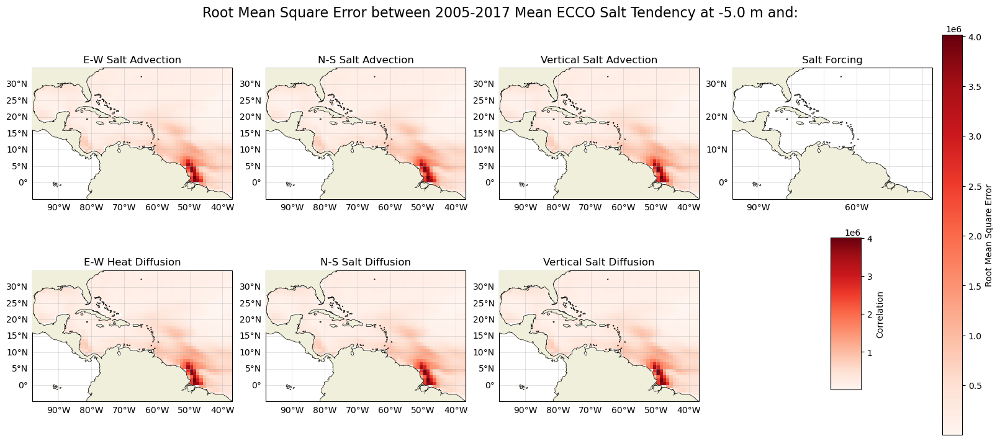

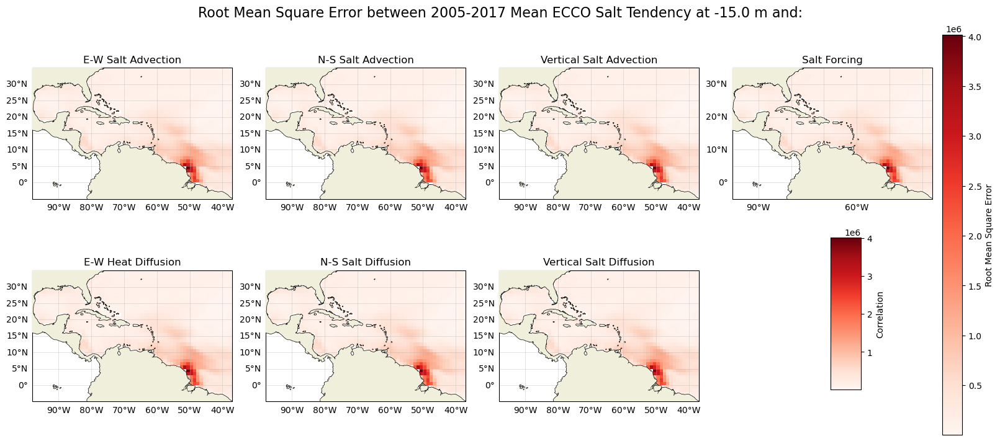

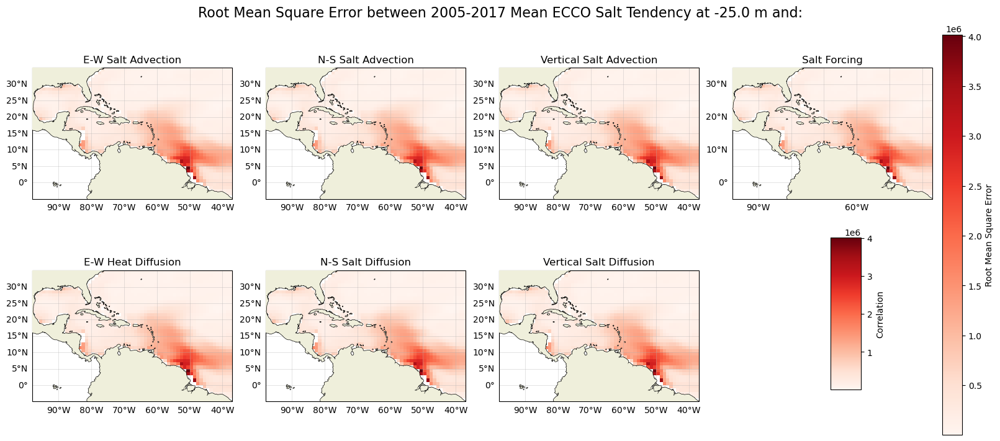

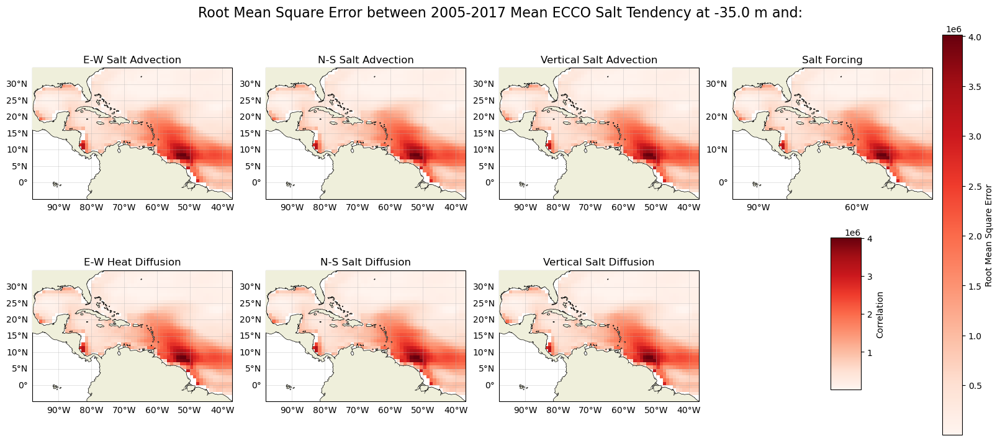

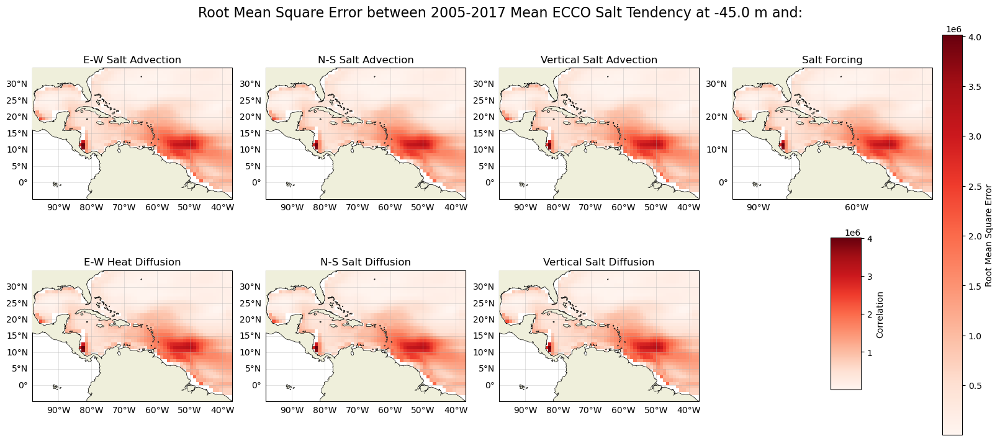

...

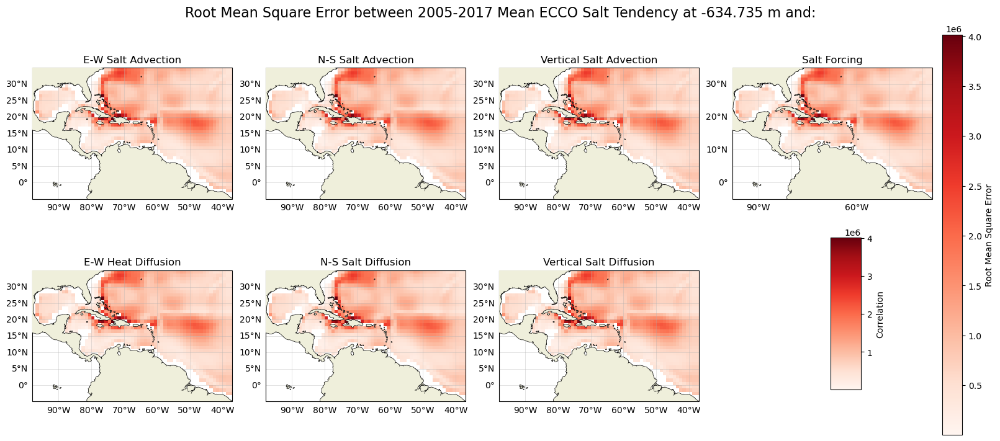

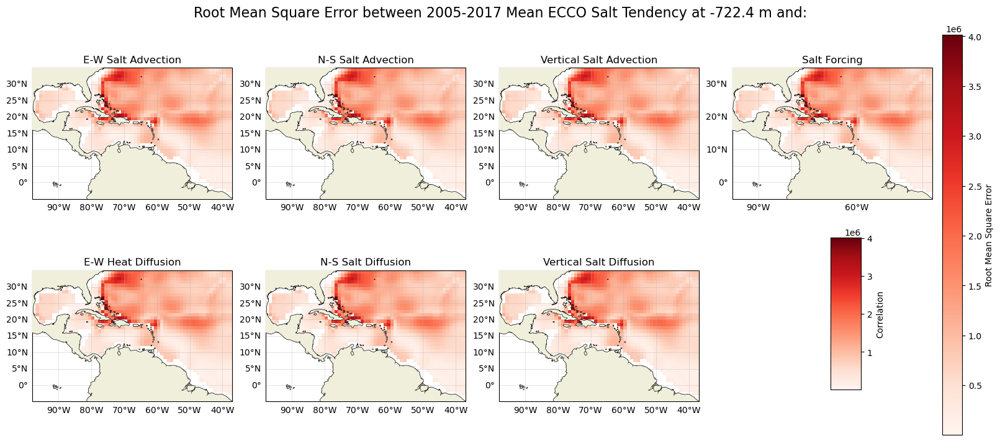

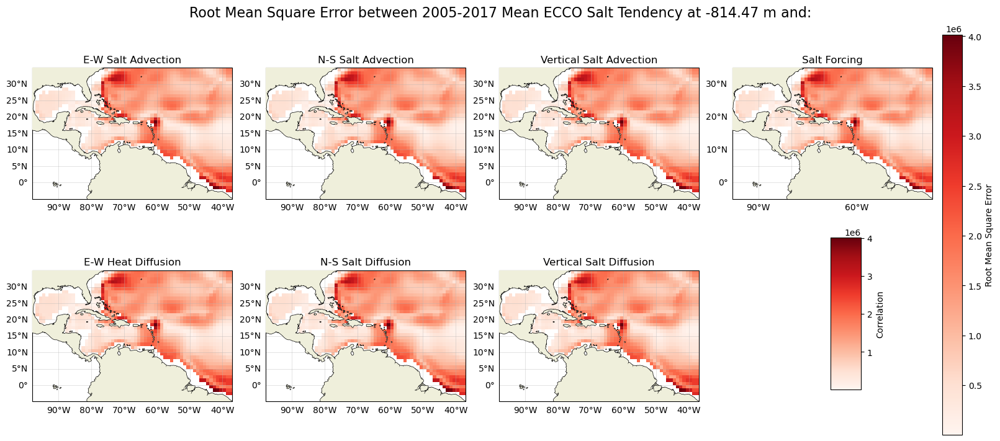

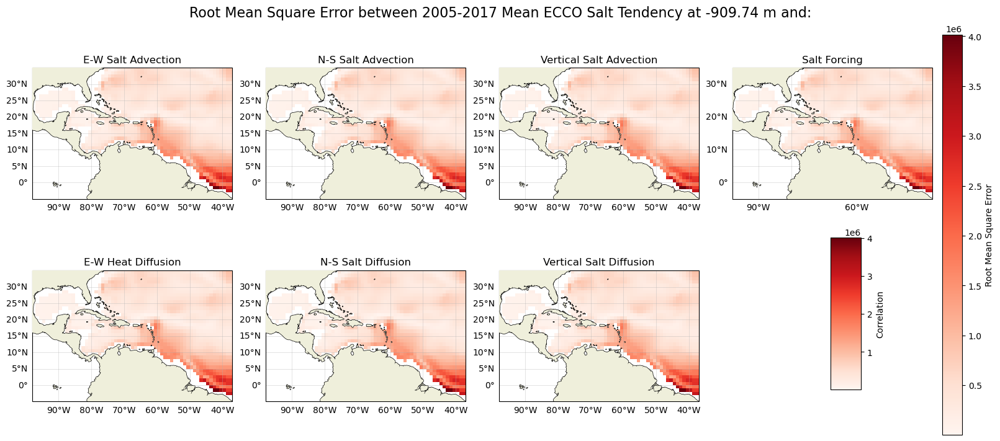

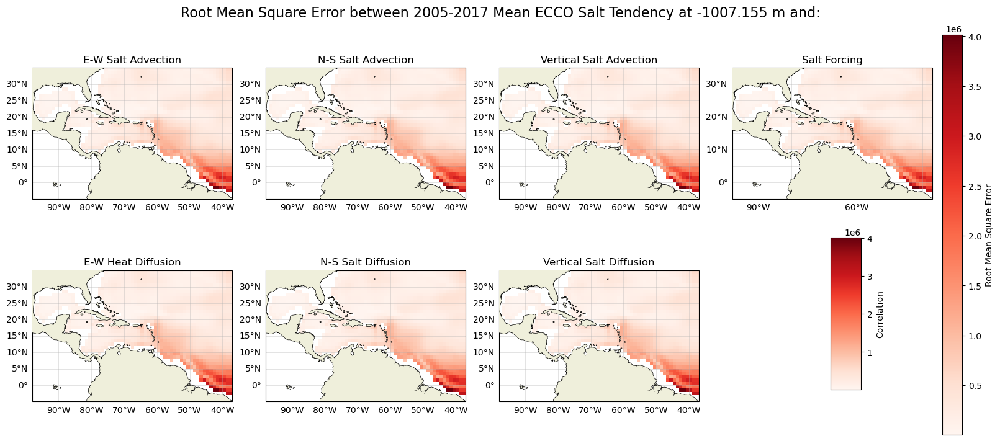

In [251]:
for k in np.arange(0,len(ds.depth)):

    fig, ax = plt.subplots(2,4, figsize=(16,7), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)
    
    s=0.9

    ####################################################################################################################################################
    ax[0,0].pcolormesh(ds.x,ds.y,salt_tendency_hadvectionx_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[0,0].coastlines(linewidth=1.0,zorder=10)
    ax[0,0].add_feature(cartopy.feature.LAND,zorder=10)
    ax[0,0].set_title('E-W Salt Advection')
    glb = ax[0,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[0,1].pcolormesh(ds.x,ds.y,salt_tendency_hadvectiony_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[0,1].coastlines(linewidth=1.0,zorder=10)
    ax[0,1].add_feature(cartopy.feature.LAND,zorder=10)
    ax[0,1].set_title('N-S Salt Advection')
    glb = ax[0,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    
    ####################################################################################################################################################
    ax[0,2].pcolormesh(ds.x,ds.y,salt_tendency_vadvection_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[0,2].coastlines(linewidth=1.0,zorder=10)
    ax[0,2].add_feature(cartopy.feature.LAND,zorder=10)
    ax[0,2].set_title('Vertical Salt Advection')
    glb = ax[0,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[0,3].pcolormesh(ds.x,ds.y,salt_tendency_forcing_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[0,3].coastlines(linewidth=1.0,zorder=10)
    ax[0,3].add_feature(cartopy.feature.LAND,zorder=10)
    ax[0,3].set_title('Salt Forcing')
    glb = ax[0,3].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[1,0].pcolormesh(ds.x,ds.y,salt_tendency_hdiffusionx_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[1,0].coastlines(linewidth=1.0,zorder=10)
    ax[1,0].add_feature(cartopy.feature.LAND,zorder=10)
    ax[1,0].set_title('E-W Heat Diffusion')
    glb = ax[1,0].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[1,1].pcolormesh(ds.x,ds.y,salt_tendency_hdiffusiony_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[1,1].coastlines(linewidth=1.0,zorder=10)
    ax[1,1].add_feature(cartopy.feature.LAND,zorder=10)
    ax[1,1].set_title('N-S Salt Diffusion')
    glb = ax[1,1].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    ####################################################################################################################################################
    ax[1,2].pcolormesh(ds.x,ds.y,salt_tendency_vdiffusion_rmse[:,:,k],transform =cartopy.crs.PlateCarree(),cmap='Reds')
    ax[1,2].coastlines(linewidth=1.0,zorder=10)
    ax[1,2].add_feature(cartopy.feature.LAND,zorder=10)
    ax[1,2].set_title('Vertical Salt Diffusion')
    plt.colorbar(im,ax=ax[1,3],label='Correlation',aspect=5,fraction=0.4)
    glb = ax[1,2].gridlines(draw_labels=True, alpha=0.5, linewidth=.5 )
    glb.xlabels_top = glb.ylabels_right = False
    ####################################################################################################################################################
    
    fig.delaxes(ax[1,3])
    
    plt.colorbar(im,ax=ax[:,3],label='Root Mean Square Error',fraction=0.6)
    
    plt.suptitle('Root Mean Square Error between 2005-2017 Mean ECCO Salt Tendency at %s m and:'%(ds.depth.values[k]), fontsize=16)
    
    plotname = f'/Users/joegradone/SynologyDrive/Drive/Rutgers/Research/figures/Python/Model/ECCO/Salt_RMSE/Salt_RMSE_{-int(ds.depth.values[k])}_meters_depth.png'
    plt.savefig(plotname, bbox_inches='tight',dpi=300,facecolor='white')


Text(0.5, 0.98, '2005-2017 ECCO Mean at -105.31 m')

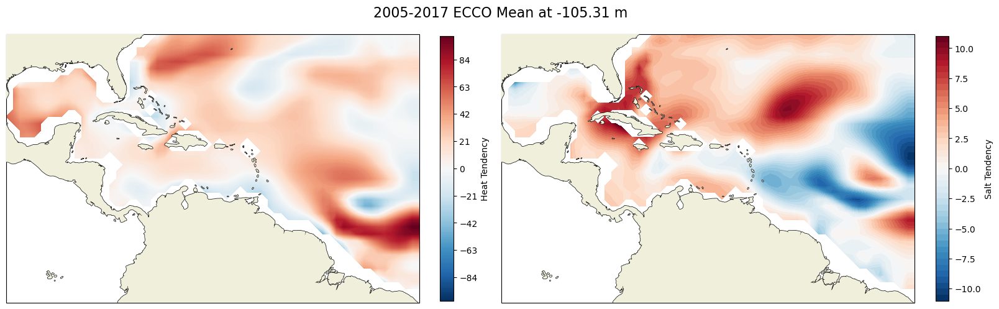

In [170]:
k=10

fig, ax = plt.subplots(1,2, figsize=(16,5), subplot_kw=dict(projection=cartopy.crs.PlateCarree()), constrained_layout=True)

####################################################################################################################################################
temp_max = int(ds.temp_tendency.mean(dim='time').isel(depth=k).max())
temp_min = int(ds.temp_tendency.mean(dim='time').isel(depth=k).min())

if np.abs(temp_max) > np.abs(temp_min):
    levels = np.arange(-temp_max,temp_max+0.1,1)
elif np.abs(temp_max) < np.abs(temp_min):
    levels = np.arange(temp_min,(-temp_min)+0.1,1)

im=ax[0].contourf(ds.x,ds.y,ds.temp_tendency.mean(dim='time').isel(depth=k),transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=levels)
ax[0].coastlines(linewidth=1.0,zorder=10)
ax[0].add_feature(cartopy.feature.LAND,zorder=10)
plt.colorbar(im,ax=ax[0],label='Heat Tendency',fraction=0.032)
####################################################################################################################################################

####################################################################################################################################################
salt_max = int(ds.salt_tendency.mean(dim='time').isel(depth=k).max())
salt_min = int(ds.salt_tendency.mean(dim='time').isel(depth=k).min())

if np.abs(salt_max) > np.abs(salt_min):
    levels = np.arange(-salt_max,salt_max+0.1,0.5)
elif np.abs(salt_max) < np.abs(salt_min):
    levels = np.arange(salt_min,(-salt_min)+0.1,0.5)

im=ax[1].contourf(ds.x,ds.y,ds.salt_tendency.mean(dim='time').isel(depth=k),transform =cartopy.crs.PlateCarree(),cmap='RdBu_r',levels=levels)
ax[1].coastlines(linewidth=1.0,zorder=10)
ax[1].add_feature(cartopy.feature.LAND,zorder=10)
plt.colorbar(im,ax=ax[1],label='Salt Tendency',fraction=0.032)
####################################################################################################################################################

plt.suptitle('2005-2017 ECCO Mean at %s m'%(ds.depth.values[k]), fontsize=16)
